# Ex 7.1

Use the Monte Carlo NVT code we have provided to print out instantaneous values of potential energy per particle, $U/N$, and pressure, $P$, along **equilibrated** Monte Carlo simulations (of  $M=10^5$ MC steps and where the Metropolis acceptance ratio has been fixed approximately to 50%) in the following thermodynamic conditions:
- solid phase: $\rho^\star = 1.1$, $T^\star = 0.8$ (cut-off radius: $r_c = 2.2$)
- liquid phase: $\rho^\star = 0.8$, $T^\star = 1.1$ (cut-off radius: $r_c = 2.5$)
- gas phase: $\rho^\star = 0.05$, $T^\star = 1.2$ (cut-off radius: $r_c = 5.0$)

1. <span style="color:red">Once this data has been produced, compute and make pictures with a python script of the autocorrelation functions of $U/N$ and $P$ to obtain the Monte Carlo correlation time</span> via a fit with an exponential function. This will suggest you how large should be the blocks in your simulations.
2. Use the same data to study, with a python script, the estimation of the statistical uncertainties of the expectation value of $U/N$ and $P$ for different size of the blocks in the data blocking technique, from $L=M/N=10$ to $L=5\times 10^3$, being $N$ the number of blocks. <span style="color:red">Make pictures of these statistical uncertainties as a function of $L$.</span> What you observe in the statistical uncertainties after that the block size is large enough (from the point of view of the data blocking technique)?

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from pandas import Series
from IPython.display import clear_output
import time
from matplotlib.pyplot import figure
#from statsmodels.graphics.tsaplots import plot_acf

-----
## LIQUID

In [2]:
state = 'liquid'
begin = time.time()

In [3]:
start = time.time()
os.system('cp config.fcc config.0')
os.system('./clean.sh')
os.system('./Monte_Carlo_NVT.exe input.'+str(state))
end = time.time()
print('-- Estimated time of computation:', int(end-start), 'sec')

-- Estimated time of computation: 161 sec


In [4]:
f_epot1 = np.loadtxt('output.epot.0')
y_epot1 = f_epot1[:,1]
x_epot1 = np.arange(len(y_epot1))

In [5]:
f_pres1 = np.loadtxt('output.pres.0')
y_pres1 = f_pres1[:,1]
x_pres1 = np.arange(len(y_pres1))

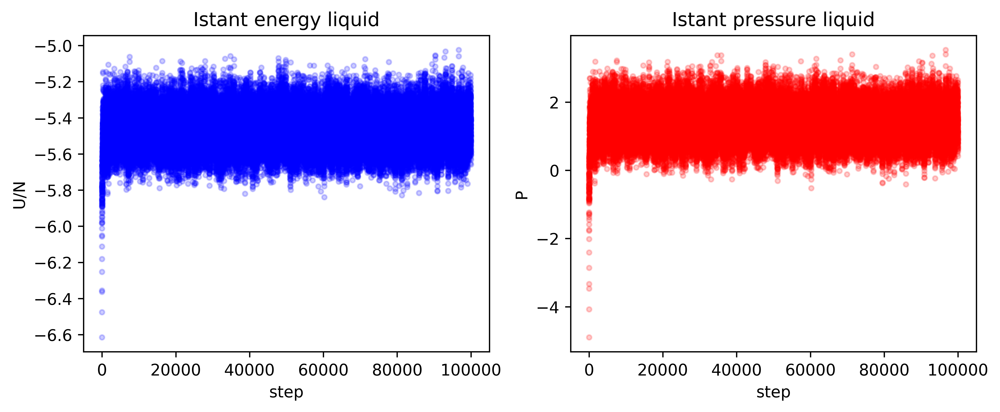

In [6]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x_epot1, y_epot1, color='blue', linestyle="none", marker='.', alpha=.2)
plt.title('Istant energy '+str(state))
plt.ylabel('U/N')
plt.xlabel('step')

plt.subplot(222)
plt.plot(x_pres1, y_pres1, color='red', linestyle="none", marker='.', alpha=.2)
plt.title('Istant pressure '+str(state))
plt.ylabel('P')
plt.xlabel('step')
plt.show()


plt.show()

In [7]:
os.system('cp config.final config.0')

0

In [8]:
start = time.time()
os.system('./clean.sh')
os.system('./Monte_Carlo_NVT.exe input.'+str(state))
end = time.time()
print('-- Estimated time of computation:', int(end-start), 'sec')

-- Estimated time of computation: 158 sec


In [9]:
f_epot2 = np.loadtxt('output.epot.0')
y_epot2 = f_epot2[:,1]
x_epot2 = np.arange(len(y_epot2))

In [10]:
f_pres2 = np.loadtxt('output.pres.0')
y_pres2 = f_pres2[:,1]
x_pres2 = np.arange(len(y_pres2))

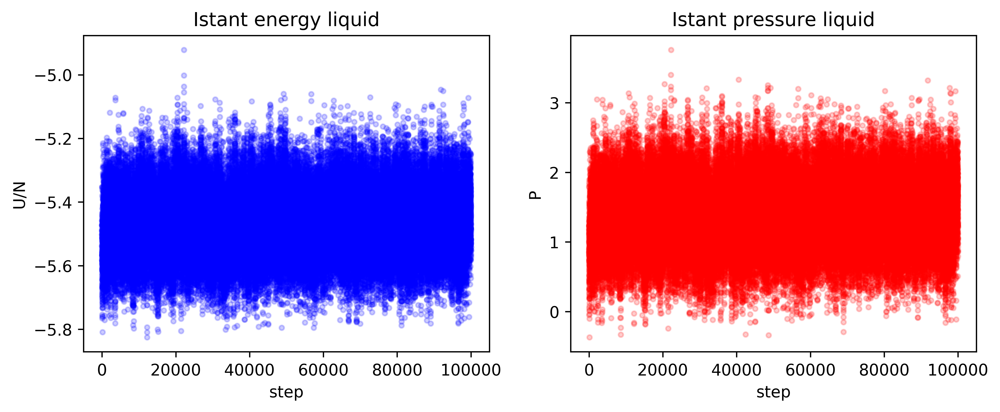

In [11]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x_epot2, y_epot2, color='blue', linestyle="none", marker='.', alpha=.2)
plt.title('Istant energy '+str(state))
plt.ylabel('U/N')
plt.xlabel('step')

plt.subplot(222)
plt.plot(x_pres2, y_pres2, color='red', linestyle="none", marker='.', alpha=.2)
plt.title('Istant pressure '+str(state))
plt.ylabel('P')
plt.xlabel('step')
plt.show()


plt.show()

### Autocorrelation

In [12]:
start = time.time()
print('-- Autocorrelation Energy')
n_range = 200
autocorrelation_epot = np.zeros(n_range)
for k in range(n_range):  
    clear_output(wait=True)
    prod1 = 0
    avg1 = 0
    avg2 = 0
    n = len(y_epot2)-k
    for i in range(n):
        prod1 += y_epot2[i] * y_epot2[i+k]
        avg1 += y_epot2[i]
        avg2 += y_epot2[i+k]
    prod1 /= n
    avg1 /= n
    avg2 /= n
    autocorrelation_epot[k] = (prod1 - avg1*avg2)/np.std(y_epot2)**2
    print('-- progression: ', int((k+1)/n_range*100), "% \r")
    
end = time.time()
print('-- Estimated time for computation:', int(end-start),'sec')

-- progression:  100 % 
-- Estimated time for computation: 22 sec


In [13]:
start = time.time()
print('-- Autocorrelation Pressure')
autocorrelation_pres = np.zeros(n_range)
for k in range(n_range):  
    clear_output(wait=True)
    prod1 = 0
    avg1 = 0
    avg2 = 0
    n = len(y_pres2)-k
    for i in range(n):
        prod1 += y_pres2[i] * y_pres2[i+k]
        avg1 += y_pres2[i]
        avg2 += y_pres2[i+k]
    prod1 /= n
    avg1 /= n
    avg2 /= n
    autocorrelation_pres[k] = (prod1 - avg1*avg2)/np.std(y_epot2)**2
    print('-- progression: ', int((k+1)/n_range*100), "% \r")
    
end = time.time()
print('-- Estimated time for computation:', int(end-start),'sec')

-- progression:  100 % 
-- Estimated time for computation: 21 sec


I have to normalize the pressure.

In [14]:
autocorrelation_pres = autocorrelation_pres/autocorrelation_pres[0]

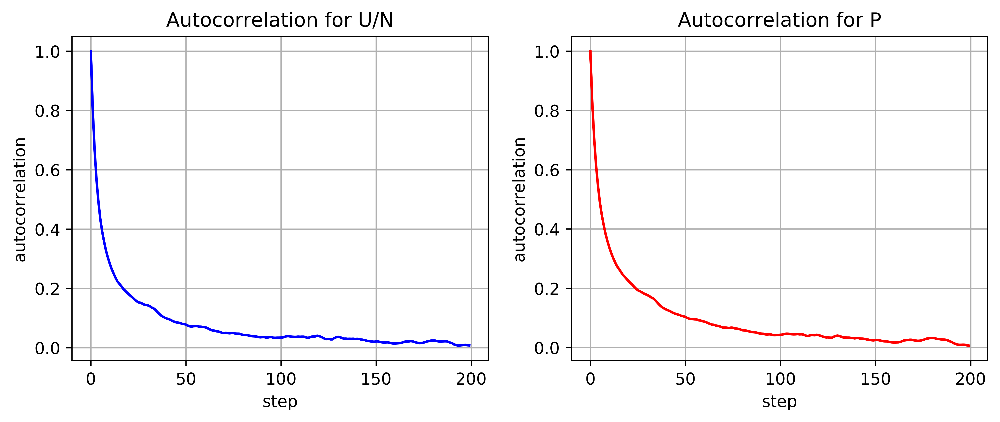

In [15]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(autocorrelation_epot, color='blue')
plt.xlabel('step')
plt.ylabel('autocorrelation')
plt.title('Autocorrelation for U/N')
#plt.yscale('log')
plt.grid(True)

plt.subplot(222)
plt.plot(autocorrelation_pres, color='red')
plt.xlabel('step')
plt.ylabel('autocorrelation')
plt.title('Autocorrelation for P')
#plt.yscale('log')
plt.grid(True)

plt.show()

In [16]:
x = np.arange(n_range)

from scipy.optimize import curve_fit

def f(x,a):
    return np.exp(-a*x)

p_opt_epot, p_cov_epot = curve_fit(f, x, autocorrelation_epot)
p_opt_pres, p_cov_pres = curve_fit(f, x, autocorrelation_pres)

Monte Carlo correlation time through fit:, pressure 9.217168772726982
Monte Carlo correlation time through fit, energy: 12.287009162543457
Just by looking at the graph, though, I can say I have to take blocks at least big 150.


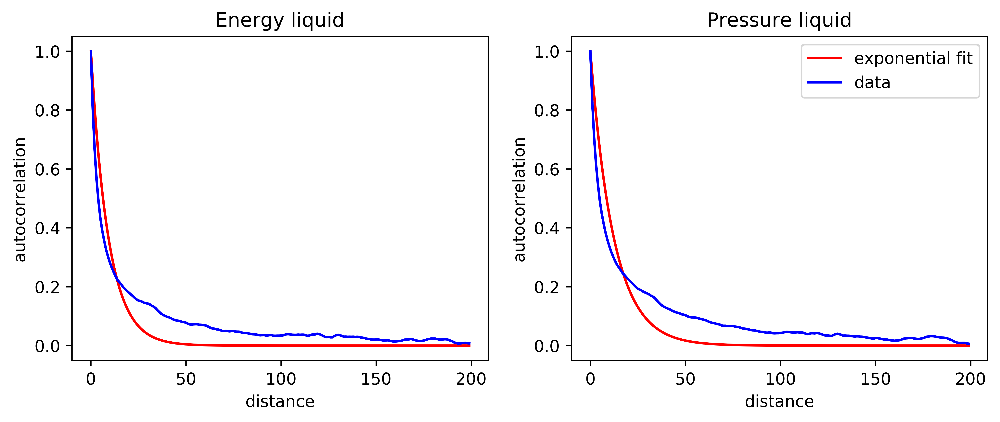

In [17]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x, np.exp(-p_opt_epot*x), color='red', label='exponential fit')
plt.plot(autocorrelation_epot, color='blue', label='data')
plt.xlabel('distance')
plt.ylabel('autocorrelation')
plt.title('Energy '+str(state))

plt.subplot(222)
plt.plot(x, np.exp(-p_opt_pres*x), color='red', label='exponential fit')
plt.plot(autocorrelation_pres, color='blue', label='data')
plt.xlabel('distance')
plt.ylabel('autocorrelation')
plt.title('Pressure '+str(state))
plt.legend(loc='best')


print('Monte Carlo correlation time through fit:, pressure', 1/p_opt_epot[0])
print('Monte Carlo correlation time through fit, energy:', 1/p_opt_pres[0])
print('Just by looking at the graph, though, I can say I have to take blocks at least big 150.')
plt.show()

### Data blocking

I only use the energy on the data blocking.

In [18]:
L = np.array([10, 100, 500, 1000, 2000, 2500, 4000, 5000])
M = len(y_epot2)
N = M/L
print(N)

[10000.  1000.   200.   100.    50.    40.    25.    20.]


In [19]:
start = time.time()

final_errors = np.zeros(len(L))
n=0
for l in L:
    extra = M%l
    if(extra != 0):
        print('The number of steps per blocks is not a multiple of the total steps taken. \n %i points will be left out' %extra)
    
    N = int(M/l)
    #print('-- Number of blocks:', N)
    #print('-- Number of steps per block:', l)
    
    avg = np.zeros(N)
    err = np.zeros(N)

    for i in range(N):
        #clear_output(wait=True)
        for j in range(l):
            avg[i] += y_epot2[j+l*(i)]
        avg[i] /= l
        #print('-- Step 1 progress:', int(i/N*100)+1, '%') 

    for i in range(N):
        #clear_output(wait=True)
        accumulate = 0
        accumulate_2 = 0
        for j in range(i+1):
            accumulate = accumulate + avg[j]
            accumulate_2 = accumulate_2 + avg[j]**2
        glob_avg = accumulate/(i+1)
        glob_avg_2 = accumulate_2/(i+1)

        err = np.sqrt((glob_avg_2 - glob_avg**2)/(i+1))

        #print('-- Step 2 progress', int(i/N*100)+1, '%')
    
    final_errors[n] = err
    n=n+1
end = time.time()
print('-- Estimated time of computation: ', int(end-start), 'sec')

-- Estimated time of computation:  39 sec


[0.00076077 0.00138387 0.00178219 0.00187099 0.00212023 0.00207625
 0.00216497 0.00229181]


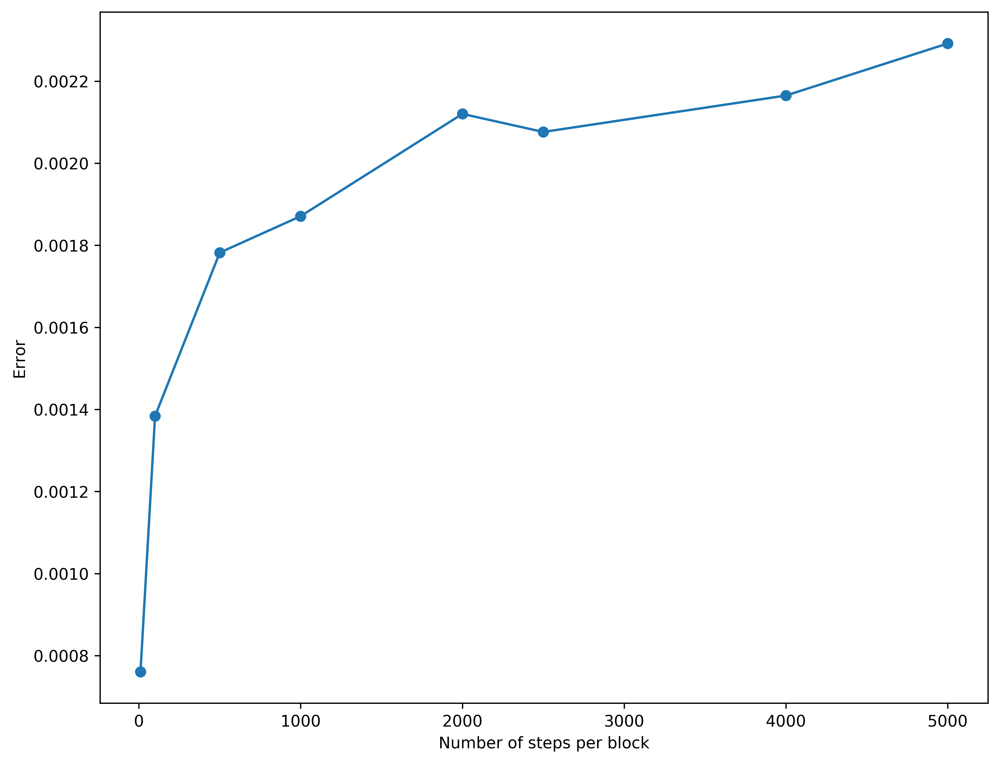

In [20]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.plot(L, final_errors, linestyle='-', marker='o')
plt.xlabel("Number of steps per block")
plt.ylabel("Error")
print(final_errors)
#print(glob_avg)
plt.show()

In [21]:
final = time.time()
print('-- Total computational time for this part: ~', int((final-begin)/60),"min")

-- Total computational time for this part: 448 sec


-----
## SOLID

In [22]:
state = 'solid'
begin = time.time()

In [23]:
start = time.time()
os.system('cp config.fcc config.0')
os.system('./clean.sh')
os.system('./Monte_Carlo_NVT.exe input.'+str(state))
end = time.time()
print('-- Estimated time of computation:', int(end-start), 'sec')

-- Estimated time of computation: 145 sec


In [24]:
f_epot1 = np.loadtxt('output.epot.0')
y_epot1 = f_epot1[:,1]
x_epot1 = np.arange(len(y_epot1))

In [25]:
f_pres1 = np.loadtxt('output.pres.0')
y_pres1 = f_pres1[:,1]
x_pres1 = np.arange(len(y_pres1))

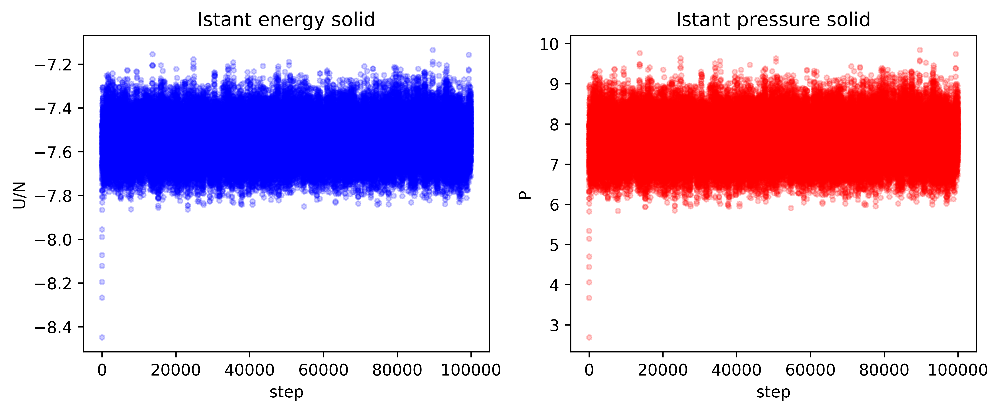

In [26]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x_epot1, y_epot1, color='blue', linestyle="none", marker='.', alpha=.2)
plt.title('Istant energy '+str(state))
plt.ylabel('U/N')
plt.xlabel('step')

plt.subplot(222)
plt.plot(x_pres1, y_pres1, color='red', linestyle="none", marker='.', alpha=.2)
plt.title('Istant pressure '+str(state))
plt.ylabel('P')
plt.xlabel('step')
plt.show()


plt.show()

In [27]:
os.system('cp config.final config.0')

0

In [28]:
start = time.time()
os.system('./clean.sh')
os.system('./Monte_Carlo_NVT.exe input.'+str(state))
end = time.time()
print('-- Estimated time of computation:', int(end-start), 'sec')

-- Estimated time of computation: 145 sec


In [29]:
f_epot2 = np.loadtxt('output.epot.0')
y_epot2 = f_epot2[:,1]
x_epot2 = np.arange(len(y_epot2))

In [30]:
f_pres2 = np.loadtxt('output.pres.0')
y_pres2 = f_pres2[:,1]
x_pres2 = np.arange(len(y_pres2))

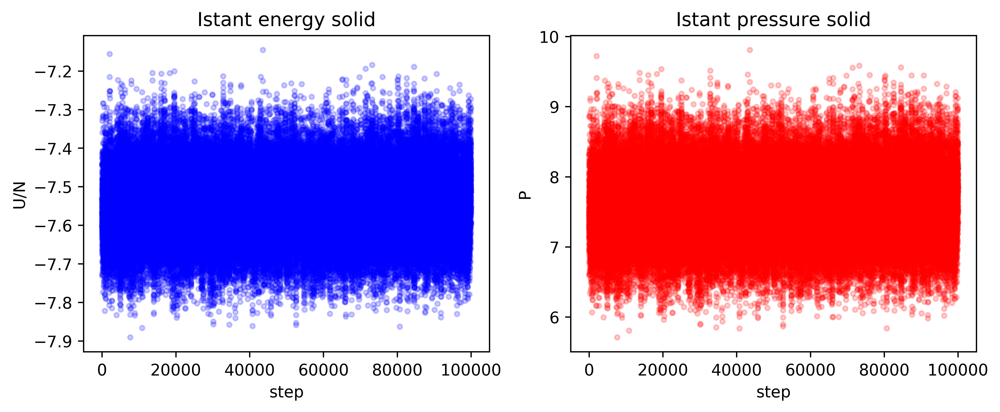

In [31]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x_epot2, y_epot2, color='blue', linestyle="none", marker='.', alpha=.2)
plt.title('Istant energy '+str(state))
plt.ylabel('U/N')
plt.xlabel('step')

plt.subplot(222)
plt.plot(x_pres2, y_pres2, color='red', linestyle="none", marker='.', alpha=.2)
plt.title('Istant pressure '+str(state))
plt.ylabel('P')
plt.xlabel('step')
plt.show()


plt.show()

### Autocorrelation

In [32]:
start = time.time()
print('-- Autocorrelation Energy')
n_range = 200
autocorrelation_epot = np.zeros(n_range)
for k in range(n_range):  
    clear_output(wait=True)
    prod1 = 0
    avg1 = 0
    avg2 = 0
    n = len(y_epot2)-k
    for i in range(n):
        prod1 += y_epot2[i] * y_epot2[i+k]
        avg1 += y_epot2[i]
        avg2 += y_epot2[i+k]
    prod1 /= n
    avg1 /= n
    avg2 /= n
    autocorrelation_epot[k] = (prod1 - avg1*avg2)/np.std(y_epot2)**2
    print('-- progression: ', int((k+1)/n_range*100), "%", end='\r')
    
end = time.time()
print('-- Estimated time for computation:', int(end-start),'sec')

-- progression:  100 % 
-- Estimated time for computation: 23 sec


In [33]:
start = time.time()
print('-- Autocorrelation Pressure')
autocorrelation_pres = np.zeros(n_range)
for k in range(n_range):  
    clear_output(wait=True)
    prod1 = 0
    avg1 = 0
    avg2 = 0
    n = len(y_pres2)-k
    for i in range(n):
        prod1 += y_pres2[i] * y_pres2[i+k]
        avg1 += y_pres2[i]
        avg2 += y_pres2[i+k]
    prod1 /= n
    avg1 /= n
    avg2 /= n
    autocorrelation_pres[k] = (prod1 - avg1*avg2)/np.std(y_epot2)**2
    print('-- progression: ', int((k+1)/n_range*100), "%", end='\r')
    
end = time.time()
print('-- Estimated time for computation:', int(end-start),'sec')

-- progression:  100 % 
-- Estimated time for computation: 22 sec


I have to normalize the pressure.

In [34]:
autocorrelation_pres = autocorrelation_pres/autocorrelation_pres[0]

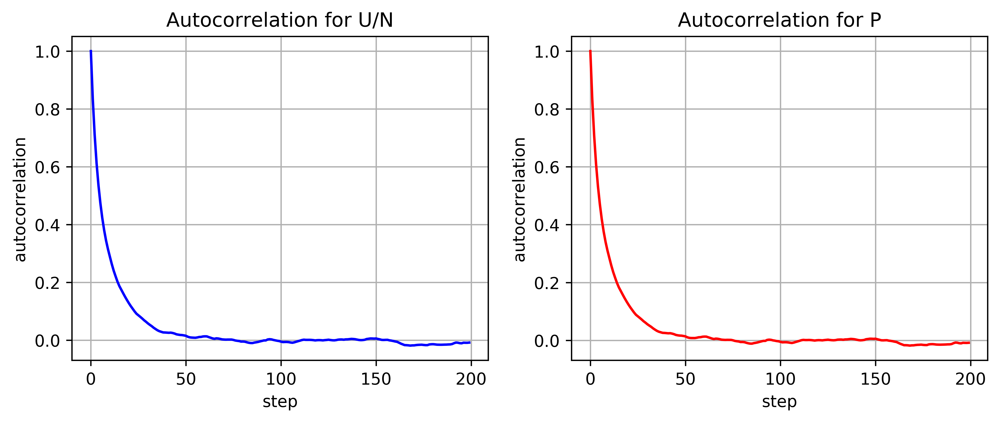

In [35]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(autocorrelation_epot, color='blue')
plt.xlabel('step')
plt.ylabel('autocorrelation')
plt.title('Autocorrelation for U/N')
#plt.yscale('log')
plt.grid(True)

plt.subplot(222)
plt.plot(autocorrelation_pres, color='red')
plt.xlabel('step')
plt.ylabel('autocorrelation')
plt.title('Autocorrelation for P')
#plt.yscale('log')
plt.grid(True)

plt.show()

In [36]:
x = np.arange(n_range)

from scipy.optimize import curve_fit

def f(x,a):
    return np.exp(-a*x)

p_opt_epot, p_cov_epot = curve_fit(f, x, autocorrelation_epot)
p_opt_pres, p_cov_pres = curve_fit(f, x, autocorrelation_pres)

Monte Carlo correlation time through fit:, pressure 8.191836572839422
Monte Carlo correlation time through fit, energy: 8.061353012525231
Just by looking at the graph, though, I can say I have to take blocks at least big ~70.


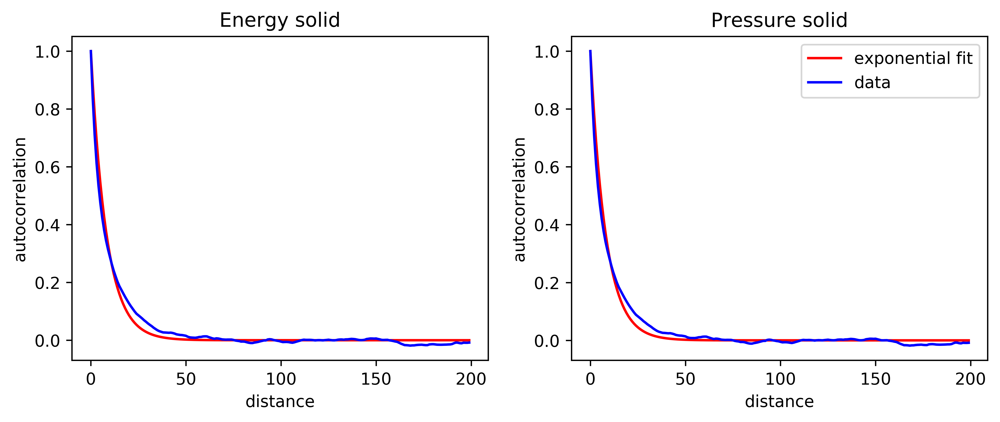

In [37]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x, np.exp(-p_opt_epot*x), color='red', label='exponential fit')
plt.plot(autocorrelation_epot, color='blue', label='data')
plt.xlabel('distance')
plt.ylabel('autocorrelation')
plt.title('Energy '+str(state))

plt.subplot(222)
plt.plot(x, np.exp(-p_opt_pres*x), color='red', label='exponential fit')
plt.plot(autocorrelation_pres, color='blue', label='data')
plt.xlabel('distance')
plt.ylabel('autocorrelation')
plt.title('Pressure '+str(state))
plt.legend(loc='best')


print('Monte Carlo correlation time through fit:, pressure', 1/p_opt_epot[0])
print('Monte Carlo correlation time through fit, energy:', 1/p_opt_pres[0])
print('Just by looking at the graph, though, I can say I have to take blocks at least big ~70.')
plt.show()

### Data blocking

I only use the energy on the data blocking.

In [38]:
L = np.array([10, 100, 500, 1000, 2000, 2500, 4000, 5000])
M = len(y_epot2)
N = M/L
print(N)

[10000.  1000.   200.   100.    50.    40.    25.    20.]


In [39]:
start = time.time()

final_errors = np.zeros(len(L))
n=0
for l in L:
    extra = M%l
    if(extra != 0):
        print('The number of steps per blocks is not a multiple of the total steps taken. \n %i points will be left out' %extra)
    
    N = int(M/l)
    #print('-- Number of blocks:', N)
    #print('-- Number of steps per block:', l)
    
    avg = np.zeros(N)
    err = np.zeros(N)

    for i in range(N):
        #clear_output(wait=True)
        for j in range(l):
            avg[i] += y_epot2[j+l*(i)]
        avg[i] /= l
        #print('-- Step 1 progress:', int(i/N*100)+1, '%') 

    for i in range(N):
        #clear_output(wait=True)
        accumulate = 0
        accumulate_2 = 0
        for j in range(i+1):
            accumulate = accumulate + avg[j]
            accumulate_2 = accumulate_2 + avg[j]**2
        glob_avg = accumulate/(i+1)
        glob_avg_2 = accumulate_2/(i+1)

        err = np.sqrt((glob_avg_2 - glob_avg**2)/(i+1))

        #print('-- Step 2 progress', int(i/N*100)+1, '%')
    
    final_errors[n] = err
    n=n+1
end = time.time()
print('-- Estimated time of computation: ', int(end-start), 'sec')

-- Estimated time of computation:  39 sec


[0.00070777 0.00112983 0.00115761 0.00104178 0.00094414 0.00089085
 0.00100936 0.00088995]


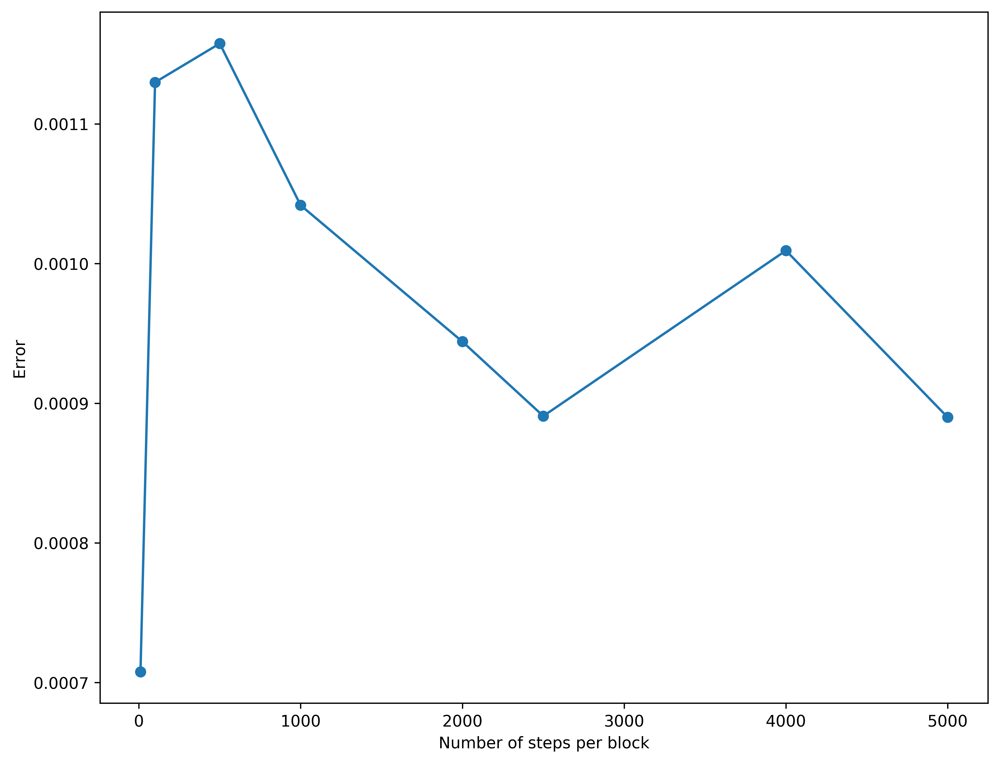

In [40]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.plot(L, final_errors, linestyle='-', marker='o')
plt.xlabel("Number of steps per block")
plt.ylabel("Error")
print(final_errors)
#print(glob_avg)
plt.show()

In [41]:
final = time.time()
print('-- Total computational time for this part: ~', int((final-begin)/60,"min")

-- Total computational time for this part: 419 sec


-----
## GAS

In [42]:
state = 'gas'
begin = time.time()

In [43]:
start = time.time()
os.system('cp config.fcc config.0')
os.system('./clean.sh')
os.system('./Monte_Carlo_NVT.exe input.'+str(state))
end = time.time()
print('-- Estimated time of computation:', int(end-start), 'sec')

-- Estimated time of computation: 106 sec


In [44]:
f_epot1 = np.loadtxt('output.epot.0')
y_epot1 = f_epot1[:,1]
x_epot1 = np.arange(len(y_epot1))

In [45]:
f_pres1 = np.loadtxt('output.pres.0')
y_pres1 = f_pres1[:,1]
x_pres1 = np.arange(len(y_pres1))

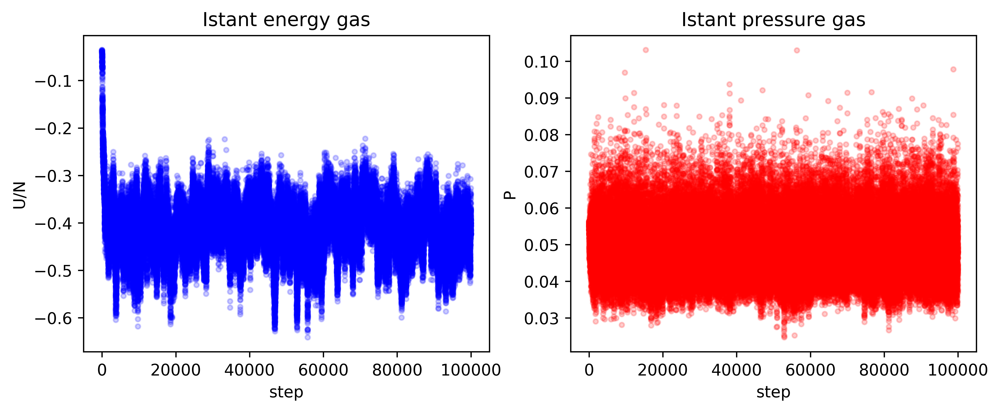

In [46]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x_epot1, y_epot1, color='blue', linestyle="none", marker='.', alpha=.2)
plt.title('Istant energy '+str(state))
plt.ylabel('U/N')
plt.xlabel('step')

plt.subplot(222)
plt.plot(x_pres1, y_pres1, color='red', linestyle="none", marker='.', alpha=.2)
plt.title('Istant pressure '+str(state))
plt.ylabel('P')
plt.xlabel('step')
plt.show()


plt.show()

In [47]:
os.system('cp config.final config.0')

0

In [48]:
start = time.time()
os.system('./clean.sh')
os.system('./Monte_Carlo_NVT.exe input.'+str(state))
end = time.time()
print('-- Estimated time of computation:', int(end-start), 'sec')

-- Estimated time of computation: 106 sec


In [49]:
f_epot2 = np.loadtxt('output.epot.0')
y_epot2 = f_epot2[:,1]
x_epot2 = np.arange(len(y_epot2))

In [50]:
f_pres2 = np.loadtxt('output.pres.0')
y_pres2 = f_pres2[:,1]
x_pres2 = np.arange(len(y_pres2))

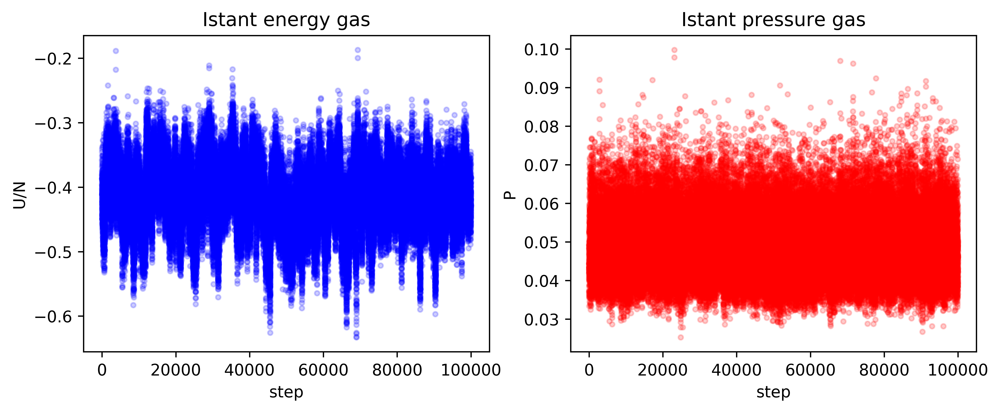

In [51]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x_epot2, y_epot2, color='blue', linestyle="none", marker='.', alpha=.2)
plt.title('Istant energy '+str(state))
plt.ylabel('U/N')
plt.xlabel('step')

plt.subplot(222)
plt.plot(x_pres2, y_pres2, color='red', linestyle="none", marker='.', alpha=.2)
plt.title('Istant pressure '+str(state))
plt.ylabel('P')
plt.xlabel('step')
plt.show()


plt.show()

### Autocorrelation

In [52]:
start = time.time()
print('-- Autocorrelation Energy')
n_range = 400
autocorrelation_epot = np.zeros(n_range)
for k in range(n_range):  
    clear_output(wait=True)
    prod1 = 0
    avg1 = 0
    avg2 = 0
    n = len(y_epot2)-k
    for i in range(n):
        prod1 += y_epot2[i] * y_epot2[i+k]
        avg1 += y_epot2[i]
        avg2 += y_epot2[i+k]
    prod1 /= n
    avg1 /= n
    avg2 /= n
    autocorrelation_epot[k] = (prod1 - avg1*avg2)/np.std(y_epot2)**2
    print('-- progression: ', int((k+1)/n_range*100), "%", end='\r')
    
end = time.time()
print('-- Estimated time for computation:', int(end-start),'sec')

-- progression:  100 % 
-- Estimated time for computation: 44 sec


In [53]:
start = time.time()
print('-- Autocorrelation Pressure')
autocorrelation_pres = np.zeros(n_range)
for k in range(n_range):  
    clear_output(wait=True)
    prod1 = 0
    avg1 = 0
    avg2 = 0
    n = len(y_pres2)-k
    for i in range(n):
        prod1 += y_pres2[i] * y_pres2[i+k]
        avg1 += y_pres2[i]
        avg2 += y_pres2[i+k]
    prod1 /= n
    avg1 /= n
    avg2 /= n
    autocorrelation_pres[k] = (prod1 - avg1*avg2)/np.std(y_epot2)**2
    print('-- progression: ', int((k+1)/n_range*100), "%", end='\r')
    
end = time.time()
print('-- Estimated time for computation:', int(end-start),'sec')

-- progression:  100 % 
-- Estimated time for computation: 44 sec


I have to normalize the pressure.

In [54]:
autocorrelation_pres = autocorrelation_pres/autocorrelation_pres[0]

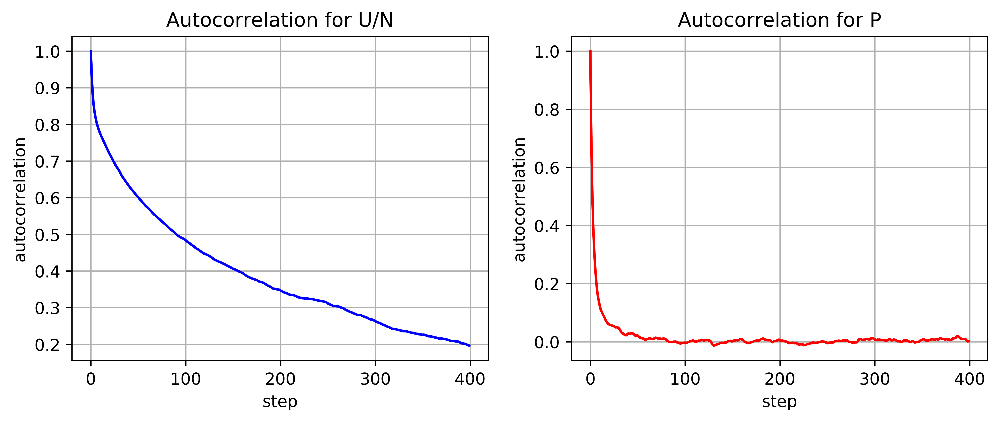

In [55]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(autocorrelation_epot, color='blue')
plt.xlabel('step')
plt.ylabel('autocorrelation')
plt.title('Autocorrelation for U/N')
#plt.yscale('log')
plt.grid(True)

plt.subplot(222)
plt.plot(autocorrelation_pres, color='red')
plt.xlabel('step')
plt.ylabel('autocorrelation')
plt.title('Autocorrelation for P')
#plt.yscale('log')
plt.grid(True)

plt.show()

In [56]:
x = np.arange(n_range)

from scipy.optimize import curve_fit

def f(x,a):
    return np.exp(-a*x)

p_opt_epot, p_cov_epot = curve_fit(f, x, autocorrelation_epot)
p_opt_pres, p_cov_pres = curve_fit(f, x, autocorrelation_pres)

Monte Carlo correlation time through fit:, pressure 182.13825349457917
Monte Carlo correlation time through fit, energy: 3.933831820201635
Just by looking at the graph, though, I can say I have to take blocks at least big 150.


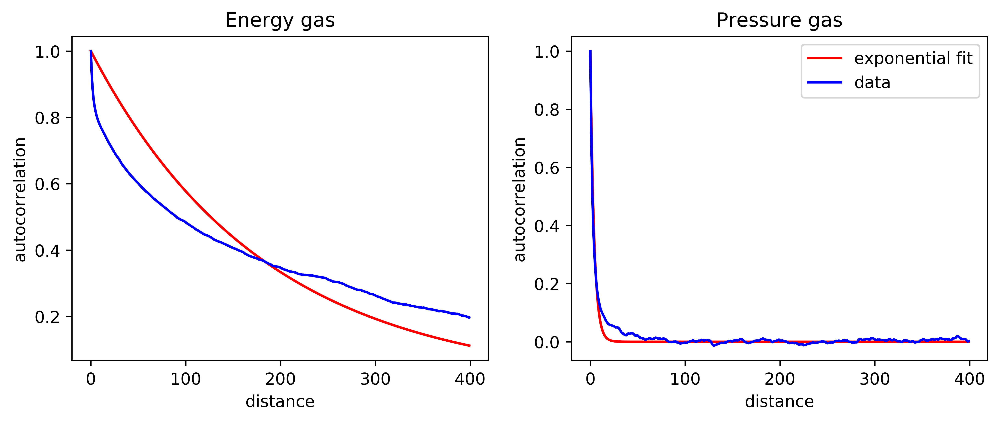

In [57]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.subplot(221)
plt.plot(x, np.exp(-p_opt_epot*x), color='red', label='exponential fit')
plt.plot(autocorrelation_epot, color='blue', label='data')
plt.xlabel('distance')
plt.ylabel('autocorrelation')
plt.title('Energy '+str(state))

plt.subplot(222)
plt.plot(x, np.exp(-p_opt_pres*x), color='red', label='exponential fit')
plt.plot(autocorrelation_pres, color='blue', label='data')
plt.xlabel('distance')
plt.ylabel('autocorrelation')
plt.title('Pressure '+str(state))
plt.legend(loc='best')


print('Monte Carlo correlation time through fit, pressure:', 1/p_opt_epot[0])
print('Monte Carlo correlation time through fit, energy:', 1/p_opt_pres[0])
print('Just by looking at the graph, though, I can say I have to take blocks at least big 150.')
plt.show()

### Data blocking

I only use the energy on the data blocking.

In [58]:
L = np.array([10, 100, 500, 1000, 2000, 2500, 4000, 5000])
M = len(y_epot2)
N = M/L
print(N)

[10000.  1000.   200.   100.    50.    40.    25.    20.]


In [59]:
start = time.time()

final_errors = np.zeros(len(L))
n=0
for l in L:
    extra = M%l
    if(extra != 0):
        print('The number of steps per blocks is not a multiple of the total steps taken. \n %i points will be left out' %extra)
    
    N = int(M/l)
    #print('-- Number of blocks:', N)
    #print('-- Number of steps per block:', l)
    
    avg = np.zeros(N)
    err = np.zeros(N)

    for i in range(N):
        #clear_output(wait=True)
        for j in range(l):
            avg[i] += y_epot2[j+l*(i)]
        avg[i] /= l
        #print('-- Step 1 progress:', int(i/N*100)+1, '%') 

    for i in range(N):
        #clear_output(wait=True)
        accumulate = 0
        accumulate_2 = 0
        for j in range(i+1):
            accumulate = accumulate + avg[j]
            accumulate_2 = accumulate_2 + avg[j]**2
        glob_avg = accumulate/(i+1)
        glob_avg_2 = accumulate_2/(i+1)

        err = np.sqrt((glob_avg_2 - glob_avg**2)/(i+1))

        #print('-- Step 2 progress', int(i/N*100)+1, '%')
    
    final_errors[n] = err
    n=n+1
end = time.time()
print('-- Estimated time of computation: ', int(end-start), 'sec')

-- Estimated time of computation:  39 sec


[0.00045339 0.00127061 0.00229354 0.00279961 0.00329119 0.00313124
 0.00352846 0.00314054]


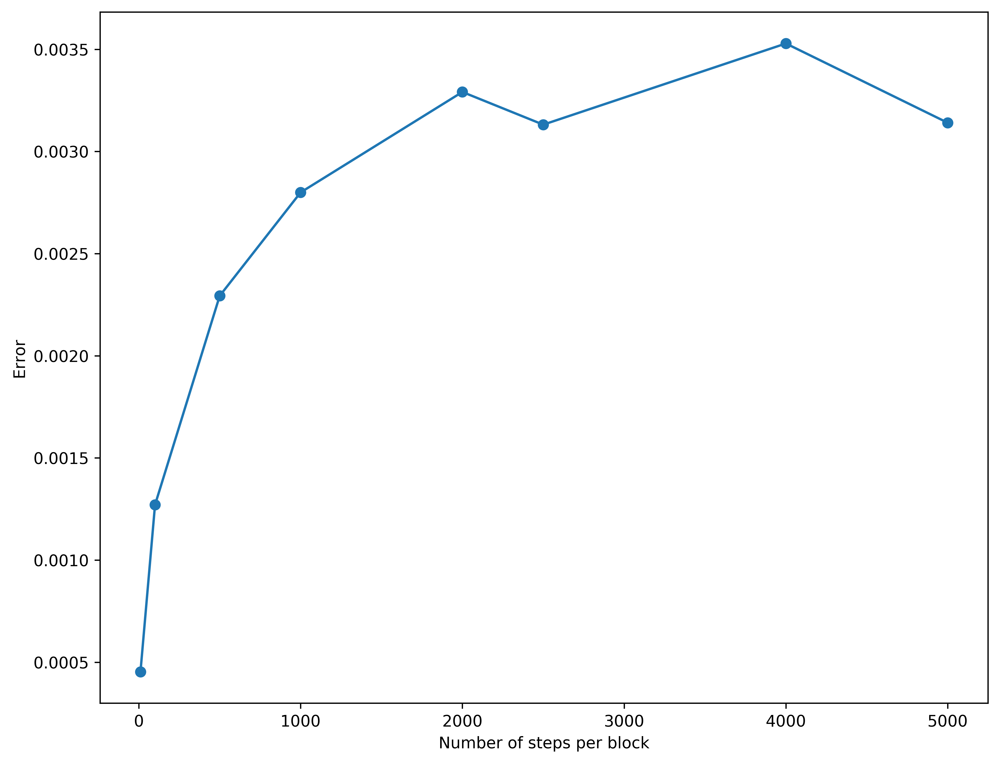

In [60]:
figure(num=None, figsize=(10, 8), dpi=600, facecolor='w', edgecolor='k')

plt.plot(L, final_errors, linestyle='-', marker='o')
plt.xlabel("Number of steps per block")
plt.ylabel("Error")
print(final_errors)
#print(glob_avg)
plt.show()

In [61]:
final = time.time()
print('-- Total computational time for this part: ~', int((final-begin)/60.),"min")

-- Total computational time for this part: 385 sec
